In [1]:
import datetime
import pandas as pd
import quandl
import matplotlib.pyplot as plt
import math
import numpy as np
import time
import gc
import random
from quandl import QuandlError
plt.style.use('alex')

pd.options.display.max_rows = 1000
pd.options.display.float_format = '{:,.4f}'.format

In [2]:
from MarketAssist import Market as Market
W = Market.Market(Market_file = 'C:/Users/awright/Desktop/January 2018/Other/trading/Market Histories/WIKIP2000_trimmed_filled.csv'
                  ,mavg_df_file = 'C:/Users/awright/Desktop/January 2018/Other/trading/Market Histories/WIKIP2000_trim_fill_mavgdf.csv' )

In [3]:
maxs = W.History[['Symbol','Close']].groupby('Symbol').max()
mins = W.History[['Symbol','Close']].groupby('Symbol').min()

norm_df = W.History[['Symbol','Date','Close']]

In [5]:
norm_df.Close

99234    46.1764
99235    46.7823
99236    46.2260
99237    47.6663
99238    47.8153
99239    47.7755
99240    48.9178
99241    48.1927
99242    48.3615
99243    47.9940
99244    47.9245
99245    47.3186
99246    47.2988
99247    47.0703
99248    47.0306
99249    48.0834
99250    47.8451
99251    48.3218
99252    47.3484
99253    48.6397
99254    48.9277
99255    48.5701
99256    49.0469
99257    48.9376
99258    49.3051
99259    49.5932
99260    50.1295
99261    50.0203
99262    50.1792
99263    50.0501
99264    51.2718
99265    50.4970
99266    51.2817
99267    51.0036
99268    50.9937
99269    51.1228
99270    51.3910
99271    51.3115
99272    50.9539
99273    51.6889
99274    51.0334
99275    51.6293
99276    50.9043
99277    50.8645
99278    51.0632
99279    51.0831
99280    51.7982
99281    52.0962
99282    51.8578
99283    53.7350
99284    52.6921
99285    52.9504
99286    52.7915
99287    52.3048
99288    52.7716
99289    52.8213
99290    52.7219
99291    52.8808
99292    53.07

In [14]:
norm_df['NormPrice'] = norm_df[['Symbol','Close']].groupby('Symbol').transform(lambda x: x.index )

C:\Users\awright\AppData\Local\Continuum\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [22]:
norm_df['NormPrice'] =norm_df[['Symbol','Close']].groupby('Symbol').transform(lambda x: x / x[min(x.index)] )

C:\Users\awright\AppData\Local\Continuum\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [3]:
mavg_set = [1,50,90]
thresh = 0
win = 10

maxs = W.History[['Symbol','Close']].groupby('Symbol').max()
mins = W.History[['Symbol','Close']].groupby('Symbol').min()

norm_df = W.History[['Symbol','Date','Close']]
norm_df['NormPrice'] = norm_df[['Symbol','Close']].groupby('Symbol').transform(lambda x: x / x[min(x.index)] )


datestart = min(norm_df.Date)

dateend = (str((datetime.datetime.now().date().year))
          + '-' + str((datetime.datetime.now().date().month))
          + '-' + str((datetime.datetime.now().date().day)))


symbols = norm_df.Symbol.unique()

mavg_dict = {'Date':norm_df[(norm_df['Date'] >= datestart) 
                                      & (norm_df['Date'] <= dateend)].Date.unique()}

for symbol in symbols:

    for mavg in mavg_set:

        label = symbol + '-' + str(mavg) + 'mavg'

        mavg_dict[label] = norm_df[(norm_df['Symbol'] == symbol) &
                                     (norm_df['Date'] >= datestart) 
                                      & (norm_df['Date'] <= dateend)].NormPrice.rolling(window=mavg).mean().values

norm_mavg_df = pd.DataFrame(mavg_dict)

start_time = time.time()
threshold = thresh
rolling_days = win
headers = ['Date'] + ['mavg' + str(mavg) for mavg in mavg_set] + ['Symbol','Trend','Reversal',
                                                               'Return','Close']
reversals = pd.DataFrame([], columns = headers).astype({headers[0]:str,
                                                        headers[1]:'float64',
                                                        headers[2]:'float64',
                                                        headers[3]:'float64',
                                                        headers[4]:str,
                                                        headers[5]:int,
                                                        headers[6]:int,
                                                        headers[7]:'float64',
                                                        headers[8]:'float64',}, parse_date = 'Date')

all_sym_df = pd.DataFrame([], columns = headers).astype({headers[0]:str,
                                                        headers[1]:'float64',
                                                        headers[2]:'float64',
                                                        headers[3]:'float64',
                                                        headers[4]:str,
                                                        headers[5]:int,
                                                        headers[6]:int,
                                                        headers[7]:'float64',
                                                        headers[8]:'float64',}, parse_date = 'Date')


for symbol in W.symbols:
    cols = ['Date']
    for mavg in mavg_set:
        col = symbol + '-' + str(mavg) + 'mavg'
        cols.append(col)

    sym_df = norm_mavg_df.loc[:,cols]
    sym_df = sym_df.fillna(0)
    sym_df = sym_df.assign(Symbol = symbol)
    sym_df = sym_df.assign(Trend = lambda x: x[cols[2]] < x[cols[3]])
    sym_df = sym_df*1
    sym_df = sym_df.assign(Reversal = 0)
    sym_df = sym_df.assign(Return = 0)

    sym_price = pd.DataFrame(W.History.loc[W.History.Symbol == symbol,['Symbol','Date','Close']])
    sym_df = sym_df.merge(sym_price, on = ['Date','Symbol'])



    sym_df.columns = headers
    sym_df = sym_df.assign(Diff = lambda x: x[headers[2]] - sym_df[headers[3]])

    sym_df['RollingDiffMin'] = sym_df.Diff.rolling(rolling_days).min()
    sym_df['RollingDiffMax'] = sym_df.Diff.rolling(rolling_days).max()

    sym_df.loc[(sym_df['Diff']  < threshold - 0.1) 
               & (sym_df['Diff'].shift(1) > threshold - 0.1)
               & (sym_df['Date'] >= min(sym_df.loc[sym_df[headers[3]] > 0 ].Date).to_pydatetime()), 'Reversal'] = -1
    sym_df.loc[(sym_df['Diff'] > threshold) 
               & (sym_df['Diff'].shift(1) < threshold)
               & (sym_df['Date'] >= min(sym_df.loc[sym_df[headers[3]] > 0 ].Date).to_pydatetime()), 'Reversal'] = 1
    
    if sym_df.loc[sym_df.Reversal != 0].Date.count() > 0:
        sym_df.loc[sym_df.Date == max(sym_df.Date),'Reversal'] = sym_df.loc[sym_df.Date == max(sym_df.loc[sym_df.Reversal != 0].Date).to_pydatetime()].Reversal.values[0]
    
    sym_df['RollingStd'] = sym_df.mavg1.rolling(window=30).std().values
    
    rev_df = sym_df[sym_df['Reversal'] != 0]
    rev_df = rev_df.assign(Return = lambda x: x.Close - x.Close.shift(1))
    rev_df.loc[rev_df['Reversal'].shift(1) == -1,'Return'] = -rev_df['Return']
    rev_df = rev_df.assign(PriceNormalizedReturn = lambda x: x.Return/x.Close)



    reversals = pd.concat([reversals,rev_df], ignore_index = True)
    all_sym_df = pd.concat([all_sym_df,sym_df],ignore_index = True)

total_return = reversals.PriceNormalizedReturn.sum()
results.append([mavg_set,thresh, win,total_return])
elapsed_time = time.time() - start_time
print('{:.3f} seconds | mavg set: {}, rolling_minmax_window: {}, soft thresh: {} ------- total return: {:.3f}'.format(elapsed_time,mavg_set, win, thresh, total_return))
#gc.collect()

C:\Users\awright\AppData\Local\Continuum\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


NameError: name 'results' is not defined

In [28]:
all_sym_df.loc[all_sym_df.mavg90 == 0,'Diff'] = 0 

C:\Users\awright\AppData\Local\Continuum\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


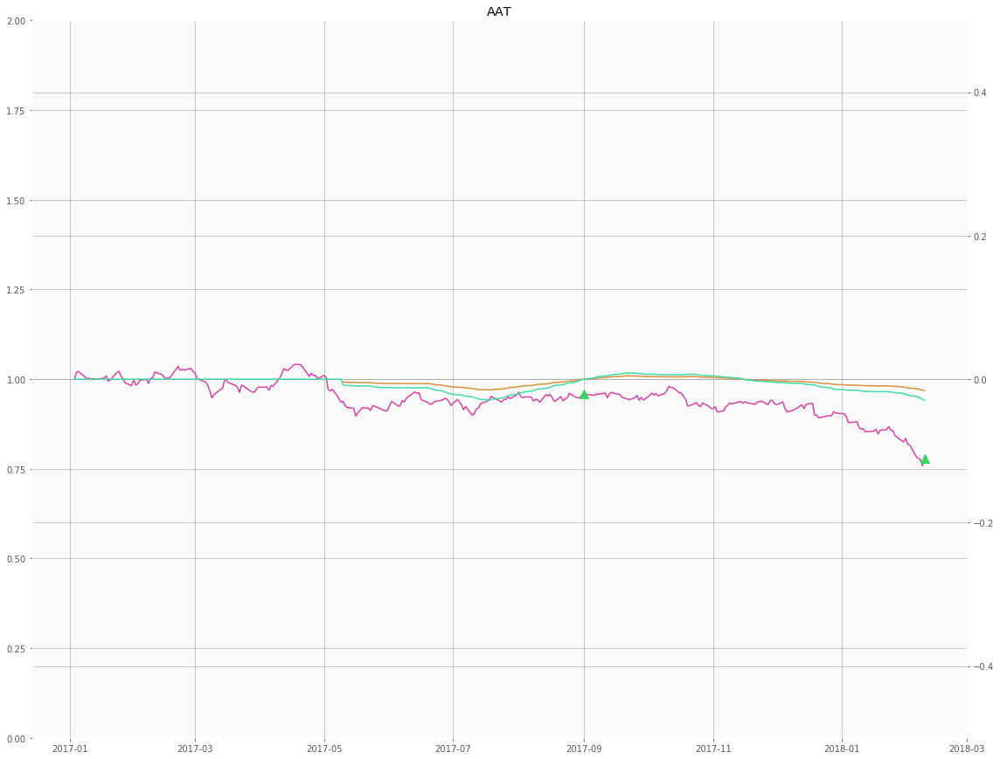

In [42]:
for sym in ['AAT']:
    
    #random.sample(all_sym_df.Symbol.unique().tolist(),50)
    
    sym_df = all_sym_df.loc[all_sym_df.Symbol == sym]
    fig, ax1 = plt.subplots(figsize=(16,12))
    
    buy_dates = sym_df[sym_df.Reversal == 1].Date
    sell_dates = sym_df[sym_df.Reversal == -1].Date
    
    buy_prices = sym_df[sym_df.Date.isin(buy_dates)].mavg1
    sell_prices = sym_df[sym_df.Date.isin(sell_dates)].mavg1
    
    
    #ax1.plot(sym_df.Date,sym_df['RollingStd'], color = W.colors[3], label = 'RollingStd')
    ax1.legend()
    #ax1.set_ylim(-1,1)
    
    ax1.plot(sym_df.Date,sym_df['mavg1'],color = W.colors[4], label = 'mavg1')
    ax1.plot(sym_df.Date, sym_df['mavg50']/sym_df['mavg90'], color = W.colors[3])
    ax1.plot(buy_dates, buy_prices, linestyle = 'None', marker = '^', ms = 10, color = W.colors[2])
    ax1.plot(sell_dates, sell_prices, linestyle = 'None', marker = 'v', ms = 10, color = W.colors[0])
    
    ax1.set_ylim(0,2)
    
    #ax1.plot(sym_df.Date, sym_df['mavg90'],color = W.colors[6], label = 'mavg90')
    ax2 = ax1.twinx()
    ax2.plot(sym_df.Date, sym_df['Diff'],color = W.colors[5], label = 'mavg50')
    #ax2.bar(sym_df.Date.tolist(), height = sym_df['RollingStd'], color = W.colors[3], label = 'RollingStd', width = 2)
    ax2.set_ylim(-0.5,0.5)
    #ax2.axhline(0.15, color = 'black')
    
    
    
    #ax2.plot(buy_dates, buy_prices, linestyle = 'None', marker = '^', ms = 10, color = W.colors[2])
    #ax2.plot(sell_dates, sell_prices, linestyle = 'None', marker = 'v', ms = 10, color = W.colors[0])
    
    #plt.legend()
    fig.tight_layout()
    plt.title('{}'.format(sym))
    plt.show()

In [18]:
sym_df

,Close,Date,Diff,Return,Reversal,RollingDiffMax,RollingDiffMin,RollingStd,Symbol,Trend,mavg1,mavg50,mavg90
208134,22.1410,2017-01-03,0.0000,0.0000,0,nan,nan,nan,KS,0,1.0000,0.0000,0.0000
208135,22.7229,2017-01-04,0.0000,0.0000,0,nan,nan,nan,KS,0,1.0263,0.0000,0.0000
208136,22.2890,2017-01-05,0.0000,0.0000,0,nan,nan,nan,KS,0,1.0067,0.0000,0.0000
208137,22.2988,2017-01-06,0.0000,0.0000,0,nan,nan,nan,KS,0,1.0071,0.0000,0.0000
208138,21.9339,2017-01-09,0.0000,0.0000,0,nan,nan,nan,KS,0,0.9906,0.0000,0.0000
208139,22.0720,2017-01-10,0.0000,0.0000,0,nan,nan,nan,KS,0,0.9969,0.0000,0.0000
208140,22.2988,2017-01-11,0.0000,0.0000,0,nan,nan,nan,KS,0,1.0071,0.0000,0.0000
208141,21.9043,2017-01-12,0.0000,0.0000,0,nan,nan,nan,KS,0,0.9893,0.0000,0.0000
208142,22.3087,2017-01-13,0.0000,0.0000,0,nan,nan,nan,KS,0,1.0076,0.0000,0.0000
208143,21.6479,2017-01-17,0.0000,0.0000,0,0.0000,0.0000,nan,KS,0,0.9777,0.0000,0.0000


In [51]:
all_sym_df[(all_sym_df.Reversal == 1) & (abs(all_sym_df.Diff - all_sym_df.RollingDiffMin) > .1) 
          & (all_sym_df.Date != '2018-02-09')].Symbol.unique()

array(['AVEO', 'BCEI', 'CENX', 'GALT', 'GMO', 'HIIQ', 'IMGN', 'INFI',
       'NLNK', 'OSUR', 'TGTX', 'VHC', 'XXII'], dtype=object)

In [54]:
all_sym_df[(all_sym_df.Reversal == 1) & (abs(all_sym_df.Diff - all_sym_df.RollingDiffMin) > .1) 
          & (all_sym_df.Date != '2018-02-09')].Return

35556    0.0000
42887    0.0000
68340    0.0000
151150   0.0000
156668   0.0000
171000   0.0000
186077   0.0000
187695   0.0000
252962   0.0000
272857   0.0000
350979   0.0000
375173   0.0000
399235   0.0000
Name: Return, dtype: float64

In [185]:
reversals[(reversals.Reversal == 1) & (abs(reversals.Diff - reversals.RollingDiffMin) > .0001) 
               & (abs(reversals.Diff - reversals.RollingDiffMin) < .03)].PriceNormalizedReturn.sum()

7.5786938509306925

In [99]:
reversals[(reversals.Reversal == 1) & (abs(reversals.Diff - reversals.RollingDiffMin) > .0001) 
          & (reversals.Date != '2018-02-09')].Return.sum()

264.4018429311289

In [175]:
reversals[((reversals.Reversal == -1) 
          & (abs(reversals.Diff - reversals.RollingDiffMin) > .001) 
          & (abs(reversals.Diff - reversals.RollingDiffMin) < .06) )].PriceNormalizedReturn.sum()

28.42624662431359

In [174]:
reversals[((reversals.Reversal == -1) 
          #& (abs(reversals.Diff - reversals.RollingDiffMin) > .001) 
          & (abs(reversals.Diff - reversals.RollingDiffMin) > .06) )].PriceNormalizedReturn.sum()

-0.055912157400765466

In [160]:
reversals

,Close,Date,Diff,PriceNormalizedReturn,Return,Reversal,RollingDiffMax,RollingDiffMin,RollingStd,Symbol,Trend,mavg1,mavg50,mavg90
0,36.6900,2017-07-24,0.0026,nan,nan,1,0.0026,-0.0227,0.0822,AA,0,1.2726,1.1492,1.1466
1,56.2400,2018-01-16,0.0006,0.3476,19.5500,1,0.0006,-0.0039,0.2118,AA,0,1.9507,1.6198,1.6193
2,45.9200,2018-02-09,0.0518,-0.2247,-10.3200,1,0.0518,0.0207,0.1050,AA,0,1.5928,1.7152,1.6633
3,49.6378,2017-06-05,0.0025,nan,nan,1,0.0025,-0.0230,0.0435,AAL,0,1.0790,0.9724,0.9698
4,47.6900,2017-11-20,0.0021,-0.0408,-1.9478,1,0.0021,-0.0182,0.0565,AAL,0,1.0366,1.0535,1.0514
5,48.3200,2018-02-09,0.0326,0.0130,0.6300,1,0.0334,0.0302,0.0639,AAL,0,1.0503,1.1439,1.1113
6,38.4700,2018-02-08,0.0009,nan,nan,1,0.0009,-0.0210,0.0398,AAN,0,1.2087,1.2448,1.2439
7,39.4600,2018-02-09,0.0039,0.0251,0.9900,1,0.0039,-0.0184,0.0402,AAN,0,1.2398,1.2463,1.2425
8,58.1700,2017-10-06,-0.1240,nan,nan,-1,0.0878,-0.1240,0.1387,AAOI,1,2.5182,2.8521,2.9760
9,30.7100,2018-02-09,-0.1703,0.8942,27.4600,-1,-0.1703,-0.2223,0.1006,AAOI,1,1.3294,1.6119,1.7822


In [147]:
reversals[reversals.Reversal == -1].Return.sum()

-161.7962551834283

In [179]:
reversals[((reversals.Reversal == 1) 
          & (abs(reversals.Diff - reversals.RollingDiffMin) > .0001) 
          & (abs(reversals.Diff - reversals.RollingDiffMin) < .03) 
          & (reversals.Date != '2018-02-09'))].Return.sum()

619.9509750468023

In [123]:
reversals[~((reversals.Reversal == 1) 
          & (abs(reversals.Diff - reversals.RollingDiffMin) > .0001) 
          & (abs(reversals.Diff - reversals.RollingDiffMin) < .03) 
          & (reversals.Date != '2018-02-09'))].Return.sum()

935.1099104482059

C:\Users\awright\AppData\Local\Continuum\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


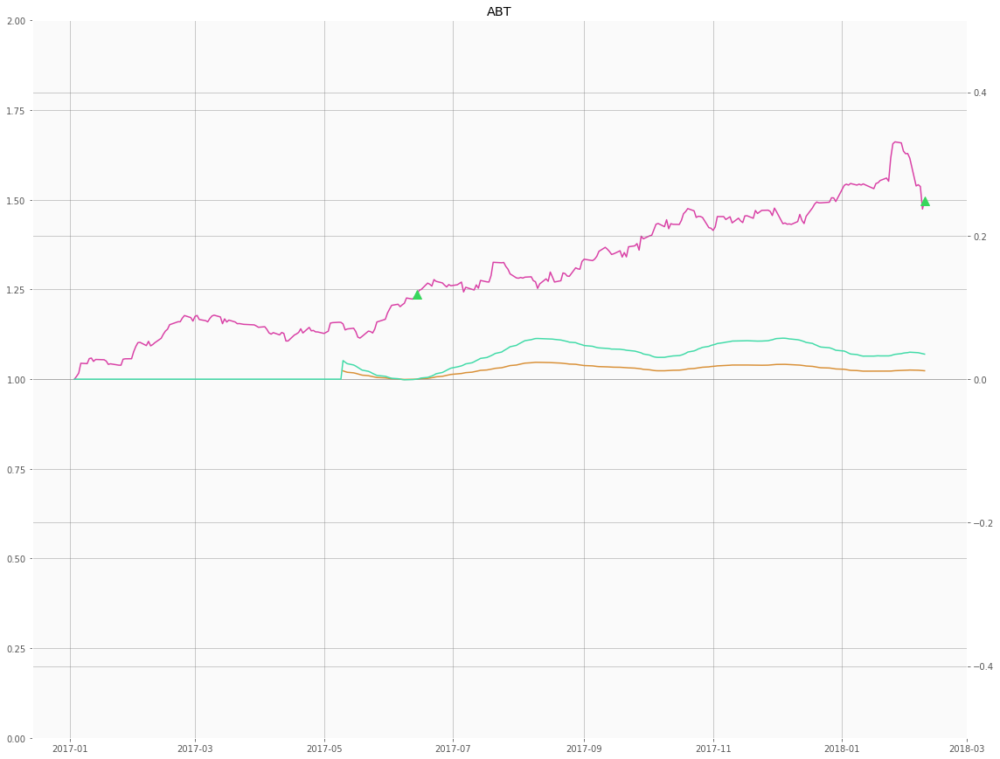

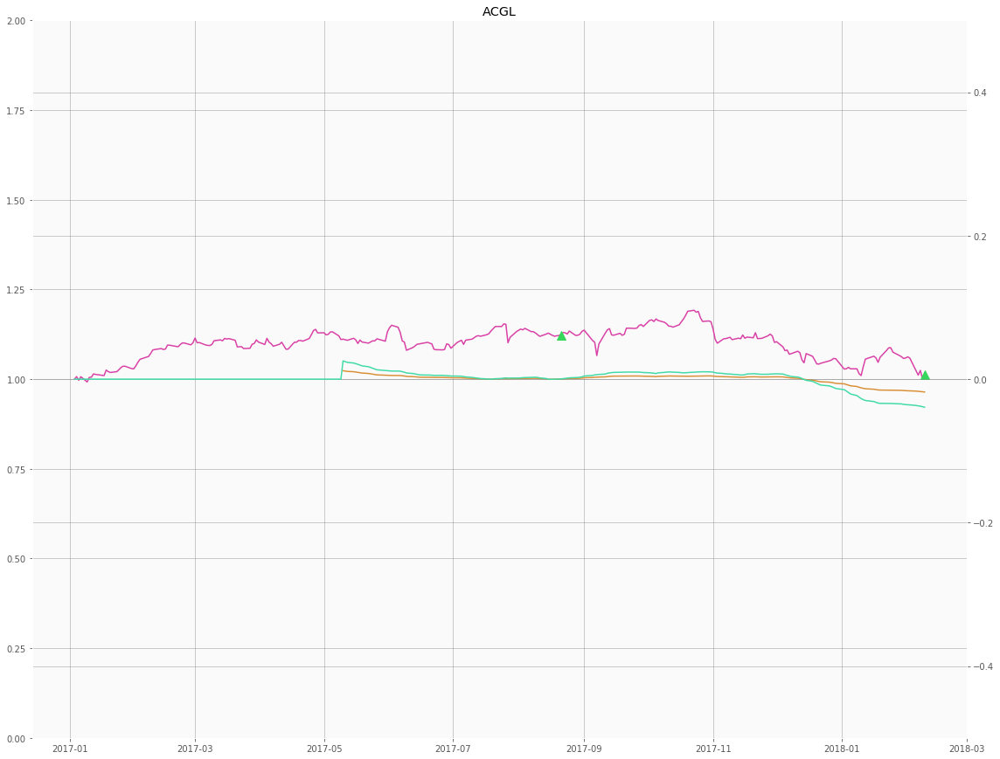

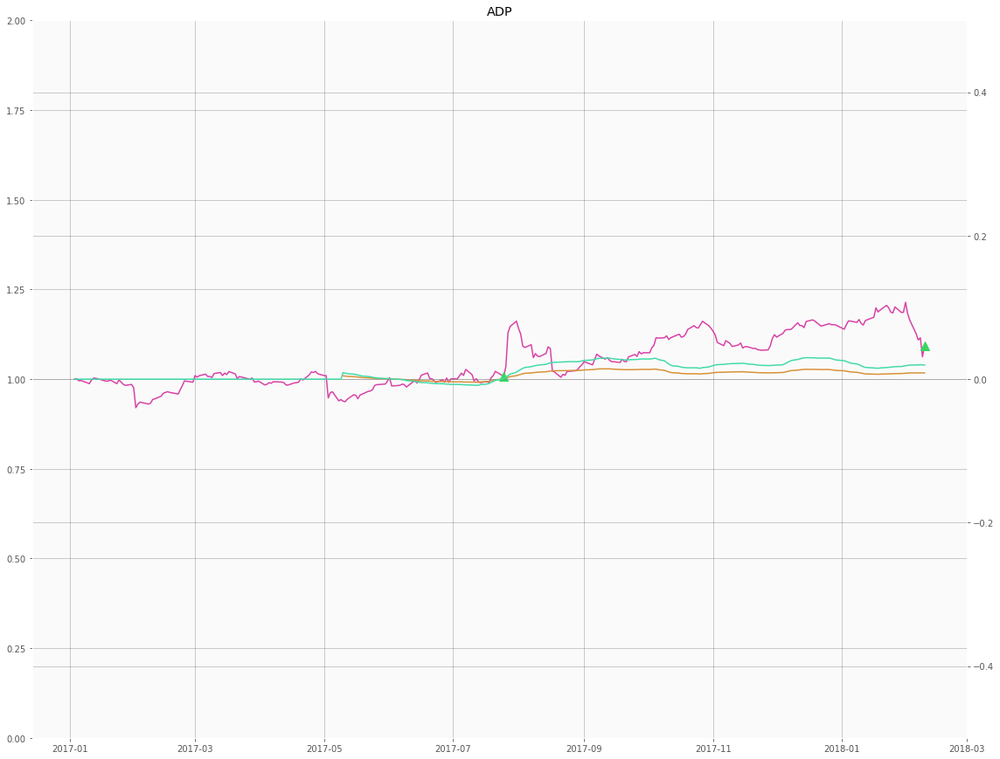

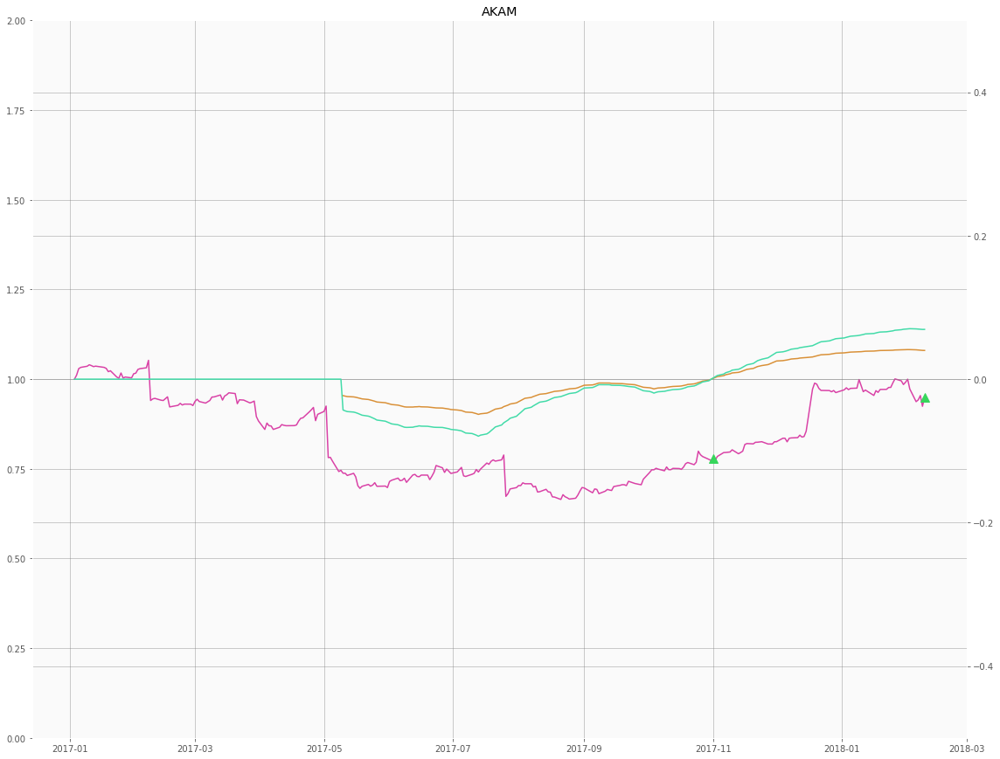

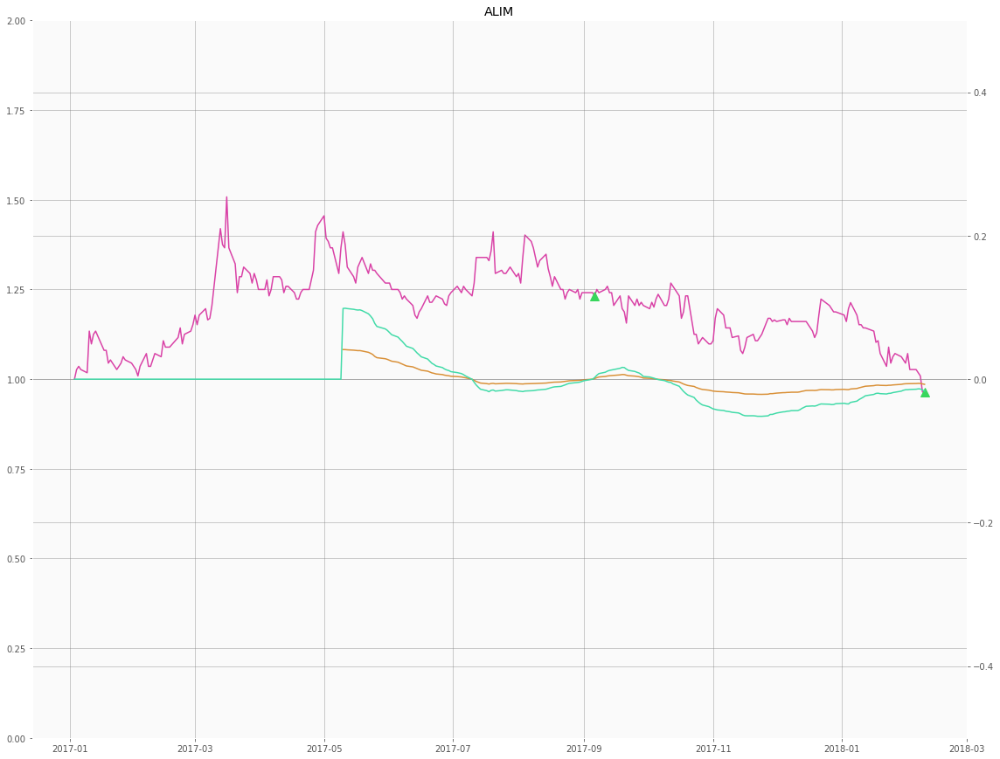

...

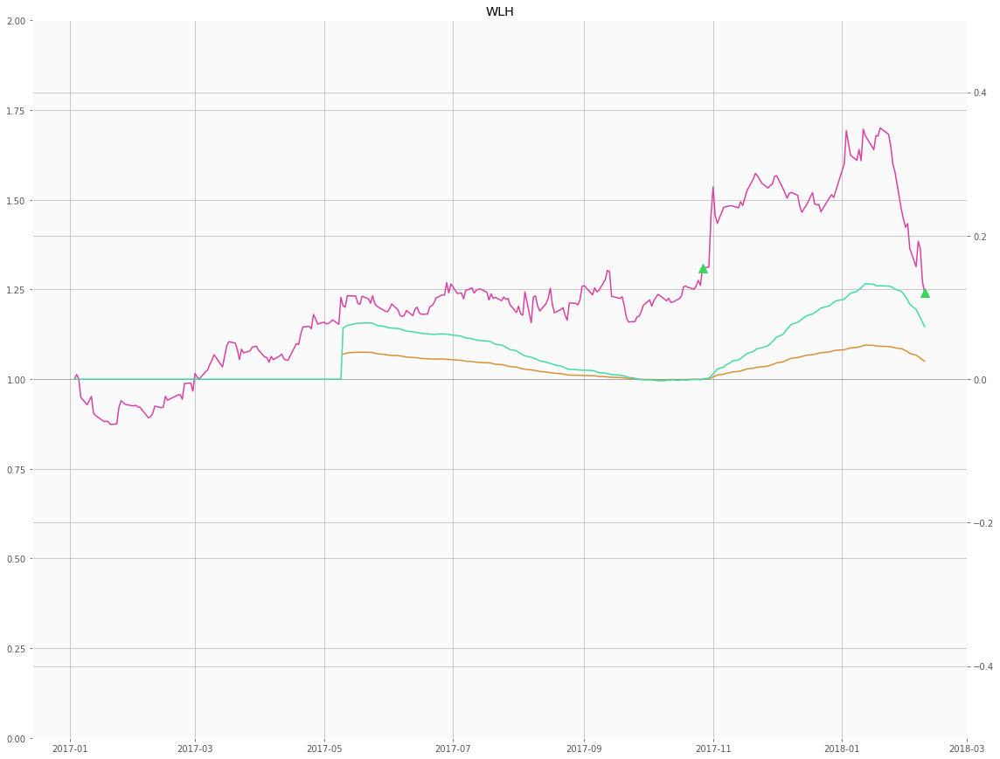

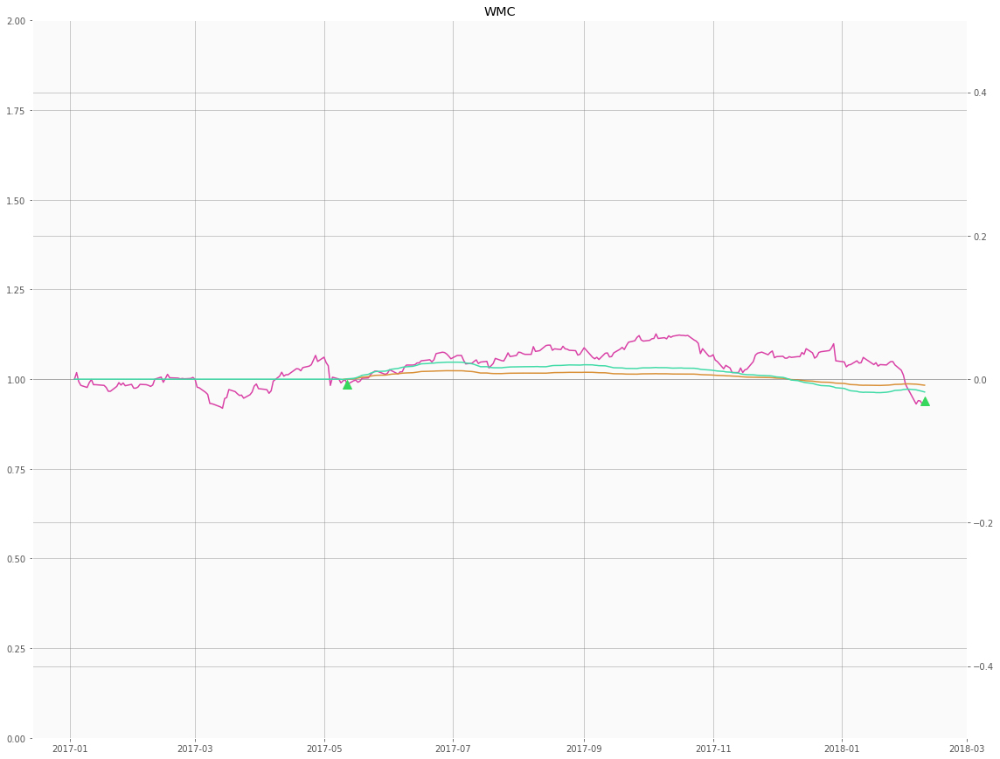

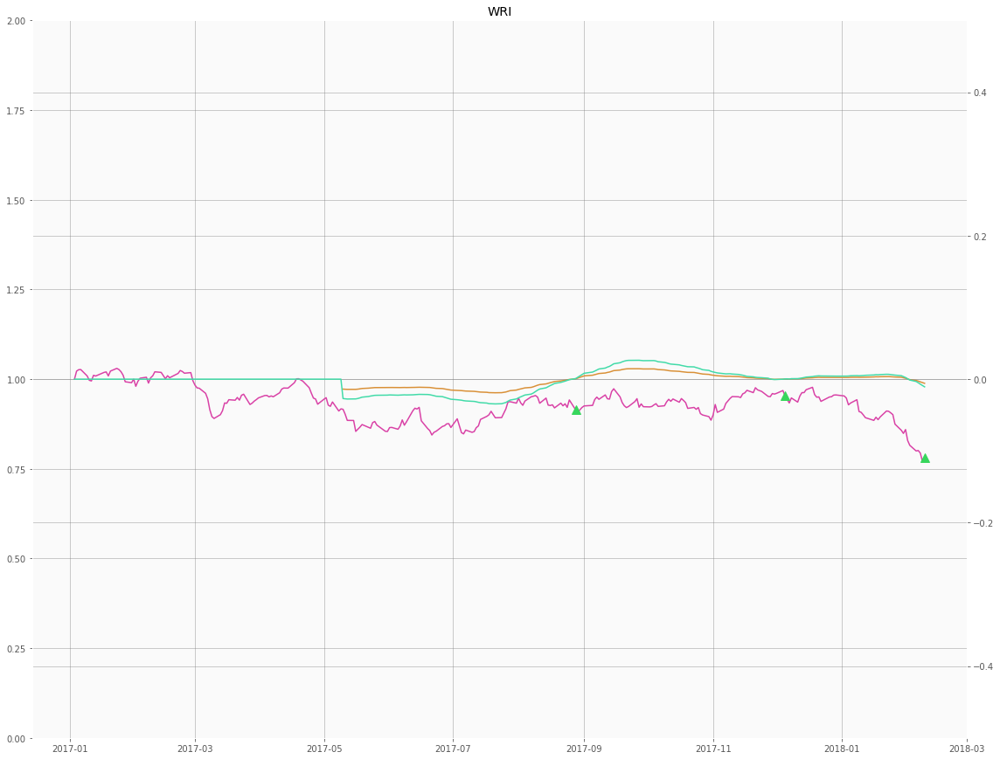

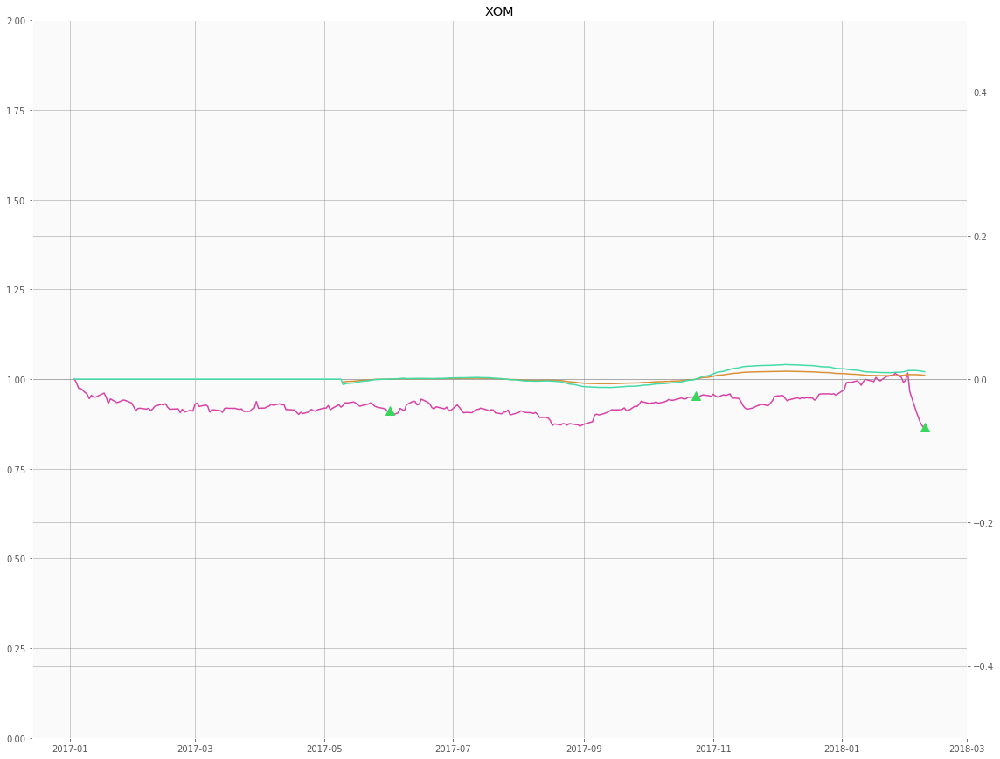

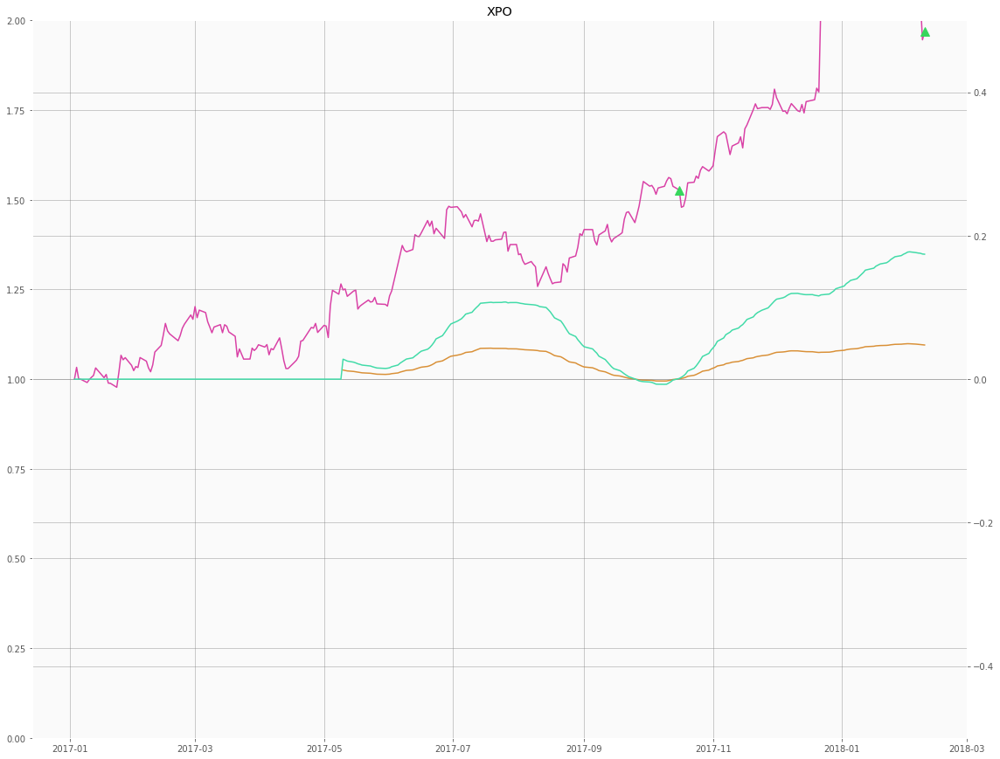

In [248]:
for sym in all_sym_df[(all_sym_df.Reversal == 1) 
          & (abs(all_sym_df.Diff - all_sym_df.RollingDiffMin) < .002) 
          & (abs(all_sym_df.Diff - all_sym_df.RollingDiffMin) > .0001)
         ].Symbol.unique():
    
    #random.sample(all_sym_df.Symbol.unique().tolist(),50)
    
    sym_df = all_sym_df.loc[all_sym_df.Symbol == sym]
    fig, ax1 = plt.subplots(figsize=(16,12))
    
    buy_dates = sym_df[sym_df.Reversal == 1].Date
    sell_dates = sym_df[sym_df.Reversal == -1].Date
    
    buy_prices = sym_df[sym_df.Date.isin(buy_dates)].mavg1
    sell_prices = sym_df[sym_df.Date.isin(sell_dates)].mavg1
    
    
    #ax1.plot(sym_df.Date,sym_df['RollingStd'], color = W.colors[3], label = 'RollingStd')
    ax1.legend()
    #ax1.set_ylim(-1,1)
    
    ax1.plot(sym_df.Date,sym_df['mavg1'],color = W.colors[4], label = 'mavg1')
    ax1.plot(sym_df.Date, sym_df['mavg50']/sym_df['mavg90'], color = W.colors[3])
    ax1.plot(buy_dates, buy_prices, linestyle = 'None', marker = '^', ms = 10, color = W.colors[2])
    ax1.plot(sell_dates, sell_prices, linestyle = 'None', marker = 'v', ms = 10, color = W.colors[0])
    
    ax1.set_ylim(0,2)
    
    #ax1.plot(sym_df.Date, sym_df['mavg90'],color = W.colors[6], label = 'mavg90')
    ax2 = ax1.twinx()
    ax2.plot(sym_df.Date, sym_df['Diff'],color = W.colors[5], label = 'mavg50')
    #ax2.bar(sym_df.Date.tolist(), height = sym_df['RollingStd'], color = W.colors[3], label = 'RollingStd', width = 2)
    ax2.set_ylim(-0.5,0.5)
    #ax2.axhline(0.15, color = 'black')
    
    
    
    #ax2.plot(buy_dates, buy_prices, linestyle = 'None', marker = '^', ms = 10, color = W.colors[2])
    #ax2.plot(sell_dates, sell_prices, linestyle = 'None', marker = 'v', ms = 10, color = W.colors[0])
    
    #plt.legend()
    fig.tight_layout()
    plt.title('{}'.format(sym))
    plt.show()

In [19]:
for sym in random.sample(all_sym_df.Symbol.unique().tolist(),50):
    
    sym_df = all_sym_df.loc[all_sym_df.Symbol == sym]
    sym_df = sym_df.fillna(0)
    fig, ax1 = plt.subplots(figsize=(16,12))

    ax1.bar(height = sym_df['RollingStd'], color = W.colors[3], label = 'RollingStd')

    
    #plt.legend()
    fig.tight_layout()
    plt.title('{}'.format(sym))
    plt.show()

TypeError: bar() missing 1 required positional argument: 'left'

In [16]:
all_sym_df[all_sym_df.Reversal == -1].count()

Close             357
Date              357
Diff              357
Return            357
Reversal          357
RollingDiffMax    357
RollingDiffMin    357
RollingStd        357
Symbol            357
Trend             357
mavg1             357
mavg50            357
mavg90            357
dtype: int64

In [187]:
reversals['ExitDate'] == reversals[['Symbol','Date']].groupby('Symbol').shift(1)

,Close,Date,Diff,PriceNormalizedReturn,Return,Reversal,RollingDiffMax,RollingDiffMin,RollingStd,Symbol,Trend,mavg1,mavg50,mavg90
0,36.6900,2017-07-24,0.0026,nan,nan,1,0.0026,-0.0227,0.0822,AA,0,1.2726,1.1492,1.1466
1,56.2400,2018-01-16,0.0006,0.3476,19.5500,1,0.0006,-0.0039,0.2118,AA,0,1.9507,1.6198,1.6193
2,45.9200,2018-02-09,0.0518,-0.2247,-10.3200,1,0.0518,0.0207,0.1050,AA,0,1.5928,1.7152,1.6633
3,49.6378,2017-06-05,0.0025,nan,nan,1,0.0025,-0.0230,0.0435,AAL,0,1.0790,0.9724,0.9698
4,47.6900,2017-11-20,0.0021,-0.0408,-1.9478,1,0.0021,-0.0182,0.0565,AAL,0,1.0366,1.0535,1.0514
5,48.3200,2018-02-09,0.0326,0.0130,0.6300,1,0.0334,0.0302,0.0639,AAL,0,1.0503,1.1439,1.1113
6,38.4700,2018-02-08,0.0009,nan,nan,1,0.0009,-0.0210,0.0398,AAN,0,1.2087,1.2448,1.2439
7,39.4600,2018-02-09,0.0039,0.0251,0.9900,1,0.0039,-0.0184,0.0402,AAN,0,1.2398,1.2463,1.2425
8,58.1700,2017-10-06,-0.1240,nan,nan,-1,0.0878,-0.1240,0.1387,AAOI,1,2.5182,2.8521,2.9760
9,30.7100,2018-02-09,-0.1703,0.8942,27.4600,-1,-0.1703,-0.2223,0.1006,AAOI,1,1.3294,1.6119,1.7822


In [ ]:
norm_df[['Symbol','Close']].groupby('Symbol').transform(lambda x: x / x[min(x.index)] )

In [193]:
reversals['ExitDate'] = reversals[['Symbol','Date']].groupby('Symbol').shift(-1)
reversals['ExitClose'] = reversals[['Symbol','Close']].groupby('Symbol').shift(-1)

In [197]:
reversals['Return'] = reversals[['Symbol','Return']].groupby('Symbol').shift(-1)
reversals['PriceNormalizedReturn'] = reversals[['Symbol','PriceNormalizedReturn']].groupby('Symbol').shift(-1)

C:\Users\awright\AppData\Local\Continuum\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.
C:\Users\awright\AppData\Local\Continuum\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [195]:
reversals = reversals[['Symbol','Reversal','Date','Close','ExitDate','ExitClose','Return','PriceNormalizedReturn',
                      'mavg1','mavg50','mavg90','Diff','RollingDiffMin','RollingDiffMax','RollingStd']]

In [202]:
reversals

,Symbol,Reversal,Date,Close,ExitDate,ExitClose,Return,PriceNormalizedReturn,mavg1,mavg50,mavg90,Diff,RollingDiffMin,RollingDiffMax,RollingStd
0,AA,1,2017-07-24,36.6900,2018-01-16,56.2400,19.5500,0.3476,1.2726,1.1492,1.1466,0.0026,-0.0227,0.0026,0.0822
1,AA,1,2018-01-16,56.2400,2018-02-09,45.9200,-10.3200,-0.2247,1.9507,1.6198,1.6193,0.0006,-0.0039,0.0006,0.2118
2,AA,1,2018-02-09,45.9200,NaT,nan,nan,nan,1.5928,1.7152,1.6633,0.0518,0.0207,0.0518,0.1050
3,AAL,1,2017-06-05,49.6378,2017-11-20,47.6900,-1.9478,-0.0408,1.0790,0.9724,0.9698,0.0025,-0.0230,0.0025,0.0435
4,AAL,1,2017-11-20,47.6900,2018-02-09,48.3200,0.6300,0.0130,1.0366,1.0535,1.0514,0.0021,-0.0182,0.0021,0.0565
5,AAL,1,2018-02-09,48.3200,NaT,nan,nan,nan,1.0503,1.1439,1.1113,0.0326,0.0302,0.0334,0.0639
6,AAN,1,2018-02-08,38.4700,2018-02-09,39.4600,0.9900,0.0251,1.2087,1.2448,1.2439,0.0009,-0.0210,0.0009,0.0398
7,AAN,1,2018-02-09,39.4600,NaT,nan,nan,nan,1.2398,1.2463,1.2425,0.0039,-0.0184,0.0039,0.0402
8,AAOI,-1,2017-10-06,58.1700,2018-02-09,30.7100,27.4600,0.8942,2.5182,2.8521,2.9760,-0.1240,-0.1240,0.0878,0.1387
9,AAOI,-1,2018-02-09,30.7100,NaT,nan,nan,nan,1.3294,1.6119,1.7822,-0.1703,-0.2223,-0.1703,0.1006


In [200]:
reversals.PriceNormalizedReturn.sum()

-10.378052503643534

In [244]:
reversals[(reversals.Reversal == 1) 
          & (abs(reversals.Diff - reversals.RollingDiffMin) < .002) 
          & (abs(reversals.Diff - reversals.RollingDiffMin) > .0001)
         ].PriceNormalizedReturn.sum()

0.6560054200899339

In [247]:
reversals[(reversals.Reversal == 1) 
          & (abs(reversals.Diff - reversals.RollingDiffMin) < .002) 
          & (abs(reversals.Diff - reversals.RollingDiffMin) > .0001)
         ].Symbol.unique()

array(['ABT', 'ACGL', 'ADP', 'AKAM', 'ALIM', 'ALSN', 'AMZN', 'ANF', 'APA',
       'ARI', 'ASNA', 'AVGO', 'AVT', 'BAH', 'BIG', 'BKCC', 'BLL', 'BMS',
       'BOOM', 'BSX', 'BURL', 'BXS', 'CATY', 'CBSH', 'CCL', 'CERN', 'CFFN',
       'CLI', 'CLX', 'CNMD', 'COF', 'COUP', 'CSLT', 'CVA', 'CVG', 'CVS',
       'CZR', 'DEPO', 'DF', 'DFS', 'DG', 'DOC', 'DOX', 'DRH', 'DSW', 'ECL',
       'EFX', 'EGY', 'EIX', 'EOG', 'EPAY', 'ESRT', 'ETH', 'ETR', 'EV',
       'EWBC', 'EXPD', 'EXPO', 'FBP', 'FDP', 'FNSR', 'FULT', 'GD', 'GLNG',
       'GLOG', 'GPT', 'GRMN', 'GWR', 'HIBB', 'HIG', 'HOS', 'HRG', 'HRS',
       'HST', 'HTA', 'INN', 'IVZ', 'JNPR', 'JW_A', 'KMB', 'KND', 'KRNY',
       'LLL', 'LVNTA', 'LYB', 'MASI', 'MDSO', 'MKTX', 'MLM', 'MPC', 'MRO',
       'MSCC', 'MWA', 'NBIX', 'NDAQ', 'NI', 'NTRI', 'NWBI', 'NXTM', 'NYCB',
       'NYMT', 'ODFL', 'OIS', 'ONB', 'PANW', 'PBCT', 'PCTY', 'PHH', 'PHM',
       'PKI', 'PSX', 'PWR', 'PX', 'QSII', 'RF', 'RGLD', 'RHP', 'RLJ',
       'RMD', 'RPT', 'RXN', 'RYN', 'SCI